# Segmentation Test for Fusion

pycodex version 0.1.8

In [69]:
from pycodex.cls import Marker
from pycodex.io import setup_gpu
from pycodex.utils import display_items
from pycodex import markerim
from pycodex import visualization as vis

setup_gpu("0,1,2,3")

Using GPU(s): ['/physical_device:GPU:0', '/physical_device:GPU:1', '/physical_device:GPU:2', '/physical_device:GPU:3']


# 00. Data Overview

In [61]:
marker_dir = "/mnt/nfs/home/wenruiwu/projects/steph_periodontal/20241022_segmentation/data/output/periodontal/"
markers = Marker(marker_dir)
markers.summary_dir()

Folders: ['reg001', 'reg002', 'reg003', 'reg004', 'reg005']


In [62]:
markers.organize_metadata(platform="fusion", subfolders=True)
markers.summary_metadata()

Summary of Regions:
    - Total regions: 5 ['reg001', 'reg002', 'reg003', 'reg004', 'reg005']
Summary of Markers:
    - Total unique markers: 28
    - Unique markers: 26 ['CD11b', 'CD11c', 'CD138', 'CD15', 'CD31', 'CD3e', 'CD4', 'CD44', 'CD45', 'CD56', 'CD68', 'CD8', 'COLA1', 'DAPI', 'E-cadherin', 'HLA-1', 'HLA-DR', 'HLA-E', 'ICOS', 'KRT14', 'Ki67', 'MUC5AC', 'MUC5B', 'Pax5', 'Vimentin', 'a-SMA']
    - Blank markers: 2 ['Blank-75', 'Blank-75_2']
    - Missing markers: 0


# 01. Crop subregion

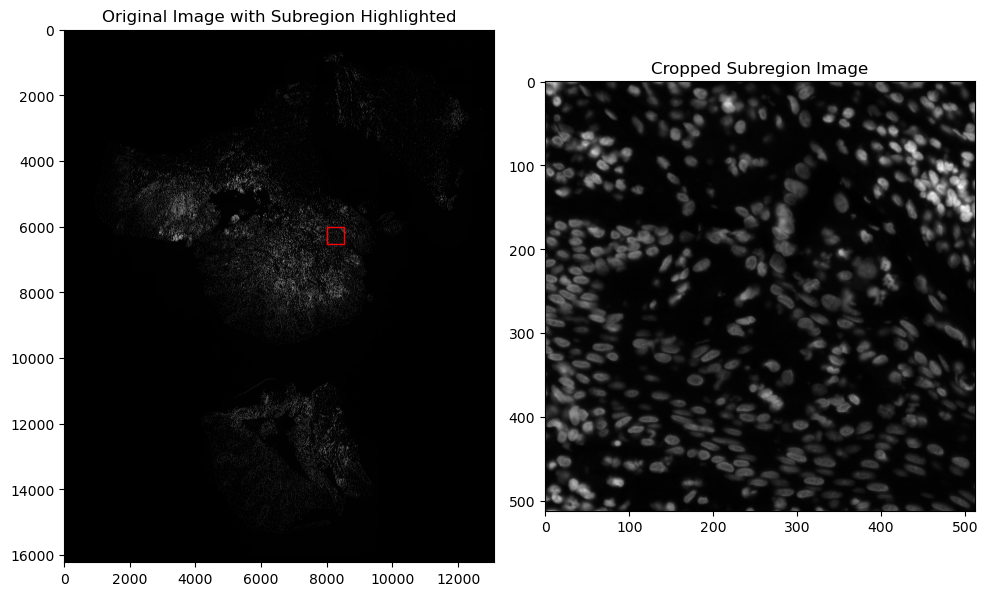

In [65]:
################################################################################
region = "reg001"
marker = "DAPI"
x_min, y_min = 8000, 6000
length = 512
################################################################################

marker_dict = markers.organize_marker_dict(region, [marker])
im = marker_dict[marker]
vis.plot_cropped_subregion(
    im,
    x_min=x_min,
    y_min=y_min,
    length=length,
    figsize=(10, 10),
    cmap="gray",
)

# 02. Segmentation

In [75]:
################################################################################
boundary_broad = ["HLA-1", "CD31", "E-cadherin"]
boundary_restricted = ["CD68", "CD3e", "HLA-DR", "CD15"]
internal_nuclear = ["DAPI"]
internal_cytoplasmic = ["a-SMA", "Vimentin"]
################################################################################

marker_list = boundary_broad + boundary_restricted + internal_nuclear + internal_cytoplasmic
marker_dict = markers.organize_marker_dict(region, marker_list)
marker_dict = {name: im[x_min : x_min + length, y_min : y_min + length] for name, im in marker_dict.items()}

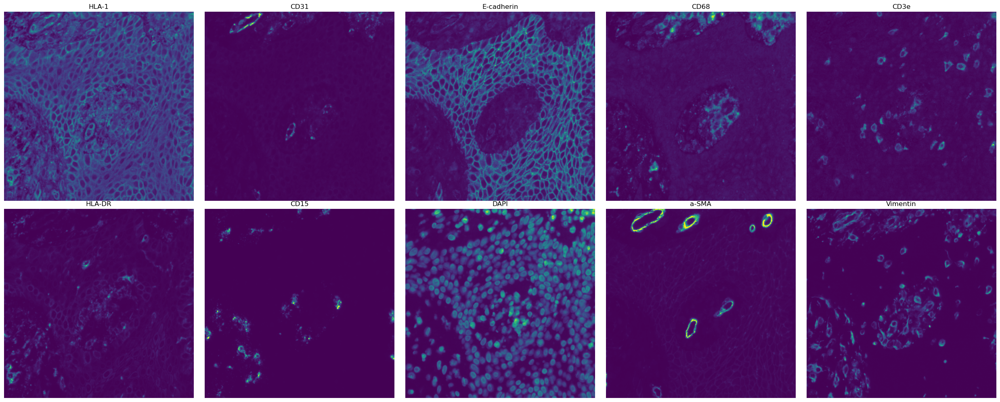

In [76]:
# preview all markers selected
vis.plot_scale_marker_sum(
    [[marker] for marker in marker_list],
    marker_list,
    marker_dict,
    scale=True,
    ncol=5,
    vmax=1,
    figsize=(5, 5),
)


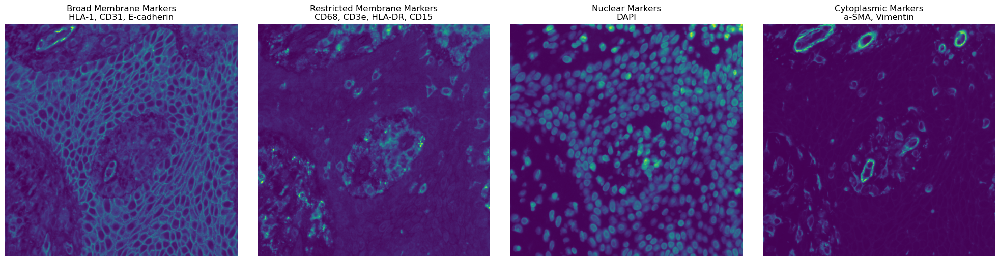

In [77]:
# preview signals summed up by category
marker_lists = [
    boundary_broad,
    boundary_restricted,
    internal_nuclear,
    internal_cytoplasmic,
]
title_list = [
    "Broad Membrane Markers",
    "Restricted Membrane Markers",
    "Nuclear Markers",
    "Cytoplasmic Markers",
]
title_list_markers = [", ".join(marker_list) for marker_list in marker_lists]
title_list = [title + "\n" + title_marker for title, title_marker in zip(title_list, title_list_markers)]

vis.plot_scale_marker_sum(
    marker_lists,
    title_list,
    marker_dict,
    scale=True,
    ncol=4,
    figsize=(5, 5),
)


## 02.01 broad, nuclear + cytoplasmic

In [78]:
################################################################################
boundary_markers = boundary_broad
internal_markers = internal_nuclear + internal_cytoplasmic
pixel_size_um = 0.5068164319979996
scale = True
maxima_threshold = 0.075
interior_threshold = 0.20
################################################################################

segmentation_mask, rgb_image, overlay = markerim.segmentation_mesmer(
    marker_dict,
    boundary_markers,
    internal_markers,
    pixel_size_um,
    scale,
    maxima_threshold,
    interior_threshold,
)

boundary_markers = ['HLA-1', 'CD31', 'E-cadherin']
internal_markers = ['DAPI', 'a-SMA', 'Vimentin']


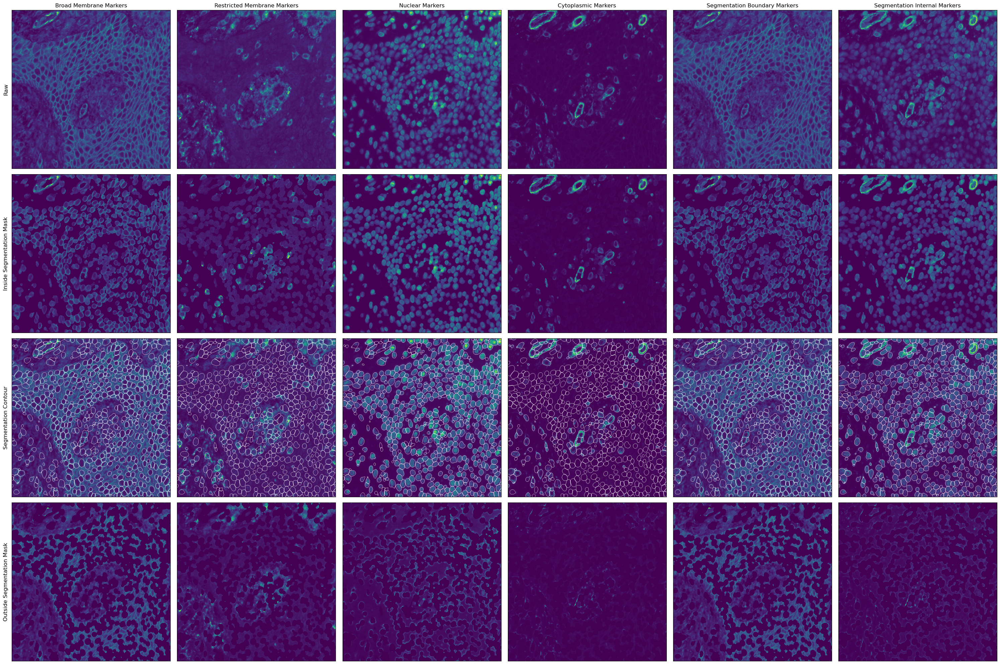

In [79]:
# preview segmentation mask
print(f"boundary_markers = {boundary_markers}")
print(f"internal_markers = {internal_markers}")

vis.plot_scale_marker_sum_segmentation(
    [
        boundary_broad,
        boundary_restricted,
        internal_nuclear,
        internal_cytoplasmic,
        boundary_markers,
        internal_markers,
    ],
    [
        "Broad Membrane Markers",
        "Restricted Membrane Markers",
        "Nuclear Markers",
        "Cytoplasmic Markers",
        "Segmentation Boundary Markers",
        "Segmentation Internal Markers",
    ],
    marker_dict,
    segmentation_mask,
    overlay,
    scale=True,
    alpha=0.75,
    figsize=(5, 5),
)


# 03. Generate OME.TIFF

In [83]:
import os
from pyqupath import ometiff
from pyqupath import annotation
import importlib
importlib.reload(ometiff)
importlib.reload(annotation)

path_ometiff = "test_test.ome.tiff"
path_geojson = "segmentation.geojson"

if os.path.exists(path_ometiff):
    os.remove(path_ometiff)
ometiff.export_ometiff_pyramid_from_dict(
    im_dict=marker_dict,
    path_ometiff=path_ometiff,
)
annotation.mask_to_geojson(
    mask=segmentation_mask,
    path_geojson=path_geojson,
    annotation_dict={1: "T", 2: "MM", 3: "B"},
)


Pyramid level sizes:
    level 1: 512 x 512 (original size)
    level 2: 256 x 256

Writing level 1: 512 x 512
    channel 1
    channel 2
    channel 3
    channel 4
    channel 5
    channel 6
    channel 7
    channel 8
    channel 9
    channel 10

Resizing image for level 2: 256 x 256

GeoJSON saved to segmentation.geojson
